# pySCENIC protocol: All neural cells downstream analyses

This notebook uses a loom file generated from the first part of the SCENIC protocol, described in: [PBMC10k_SCENIC-protocol-CLI.ipynb](https://github.com/aertslab/SCENICprotocol/blob/master/notebooks/PBMC10k_SCENIC-protocol-CLI.ipynb)

In [1]:
# import dependencies
import os
import numpy as np
import pandas as pd
import scanpy as sc
import loompy as lp
from MulticoreTSNE import MulticoreTSNE as TSNE
import json
import base64
import zlib
from pyscenic.plotting import plot_binarization
from pyscenic.export import add_scenic_metadata
from pyscenic.cli.utils import load_signatures
import matplotlib as mpl
import matplotlib.pyplot as plt
# from scanpy.plotting._tools.scatterplots import plot_scatter
import seaborn as sns

In [2]:
import pickle

#### set variables for file paths to read from and write to:

In [3]:
# set a working directory
wdir = "/project/GCRB/Hon_lab/s418610/Projects/03.Invivo_neuronal_reprogramming/analysis/17.POv2_SCENIC_analysis/"
os.chdir( wdir )

# path to anndata object, which will be updated to store Scanpy results as they are generated below
f_anndata_path = "anndata.h5ad"

# path to loom output, generated from a combination of Scanpy and pySCENIC results:
f_final_loom = 'POv2_scenic_integrated-output.loom'

In [4]:
sc.settings.verbosity = 3 # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=150)

scanpy==1.4.5.post1 anndata==0.6.22.post1 umap==0.3.10 numpy==1.17.2 scipy==1.3.1 pandas==0.25.2 scikit-learn==0.21.3 statsmodels==0.10.1 python-igraph==0.7.1 louvain==0.6.1


## 1. Extract relevant data from the integrated loom file

In [5]:
# scenic output
lf = lp.connect( f_final_loom, mode='r', validate=False )
meta = json.loads(zlib.decompress(base64.b64decode( lf.attrs.MetaData )))
exprMat = pd.DataFrame( lf[:,:], index=lf.ra.Gene, columns=lf.ca.CellID).T
auc_mtx = pd.DataFrame( lf.ca.RegulonsAUC, index=lf.ca.CellID)

### Extract regulon information

In [6]:
# create a dictionary of regulons:
regulons = {}
for i,r in pd.DataFrame(lf.ra.Regulons,index=lf.ra.Gene).iteritems():
    regulons[i] =  list(r[r==1].index.values)

### Extract cell annotation

In [8]:
# cell annotations from the loom column attributes:
cellAnnot = pd.concat(
    [
#        pd.DataFrame( lf.ca.Celltype_Garnett, index=lf.ca.CellID ),
        pd.DataFrame( lf.ca.ClusterID, index=lf.ca.CellID ),
        pd.DataFrame( lf.ca.Louvain_clusters_Scanpy, index=lf.ca.CellID ),
        pd.DataFrame( lf.ca.Fraction_mito, index=lf.ca.CellID ),
        pd.DataFrame( lf.ca.nGene, index=lf.ca.CellID ),
        pd.DataFrame( lf.ca.nUMI, index=lf.ca.CellID ),
        pd.DataFrame( lf.ca.rank_pseudotime, index=lf.ca.CellID ),
    ],
    axis=1
)
cellAnnot.columns = [
# 'Celltype_Garnett',
 'ClusterID',
 'Louvain_clusters_Scanpy',
 'Percent_mito',
 'nGene',
 'nUMI',
 'rank_pseudotime']

### Extract single-cell embeddings

In [10]:
# capture embeddings:
#dr = [
#    pd.DataFrame( lf.ca.Embedding, index=lf.ca.CellID )
#]
#dr_names = [
#    meta['embeddings'][0]['name'].replace(" ","_")
#]

dr = []
dr_names = []
# add other embeddings
drx = pd.DataFrame( lf.ca.Embeddings_X, index=lf.ca.CellID )
dry = pd.DataFrame( lf.ca.Embeddings_Y, index=lf.ca.CellID )

for i in range( len(drx.columns) ):
    dr.append( pd.concat( [ drx.iloc[:,i], dry.iloc[:,i] ], sort=False, axis=1, join='outer' ))
#    dr_names.append( meta['embeddings'][i+1]['name'].replace(" ","_").replace('/','-') )
    dr_names.append( meta['embeddings'][i]['name'].replace(" ","_").replace('/','-') )

# rename columns:
for i,x in enumerate( dr ):
    x.columns = ['X','Y']

In [11]:
len(dr) # list object storing five sets of coordinations

4

In [12]:
dr_names # Name of each set 

['Scanpy_UMAP__(highly_variable_genes)',
 'Scanpy_PC1-PC2',
 'SCENIC_AUC_t-SNE',
 'SCENIC_AUC_UMAP']

In [13]:
lf.close()

### Alternately, we can load this data into a `scanpy.AnnData` object

This can be done directly from the integrated loom file, with a few modifications to allow for SCENIC- and SCope-specific loom attributes:

In [14]:
adata = sc.read( f_final_loom, validate=False)

# drop the embeddings and extra attributes from the obs object
#adata.obs.drop( ['Embedding','Embeddings_X','Embeddings_Y','RegulonsAUC'], axis=1, inplace=True )
adata.obs.drop( ['Embeddings_X','Embeddings_Y','RegulonsAUC'], axis=1, inplace=True )

--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.


In [15]:
# add the embeddings into the adata.obsm object
for i,x in enumerate( dr ):
    adata.obsm[ 'X_'+dr_names[i] ] = x.as_matrix()

/home2/s418610/.conda/envs/py37_res_GRN/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  This is separate from the ipykernel package so we can avoid doing imports until


In [17]:
# No idea what this function does
sc._utils.sanitize_anndata( adata )

... storing 'ClusterID' as categorical
... storing 'Louvain_clusters_Scanpy' as categorical
... storing 'Regulons' as categorical


#### We can also add all metadata derived from SCENIC to the `scanpy.AnnData` object.

In [18]:
# load the regulons from a file using the load_signatures function
sig = load_signatures('regulons.csv')
adata = add_scenic_metadata(adata, auc_mtx, sig)

Create regulons from a dataframe of enriched features.
Additional columns saved: []


In [19]:
adata.obs.shape

(4601, 430)

---
## 2. Dimensionality reduction plots

### Show both highly variable genes and SCENIC UMAP plots with Louvain clustering and cell type classifications

In [20]:
adata.obs['library_name'] = [''] * adata.obs.shape[0]
for i, index in enumerate(adata.obs.index):
    if index.endswith('1'):
        adata.obs['library_name'][i] = 'lenti-Dlx2'
    elif index.endswith('2'):
        adata.obs['library_name'][i] = 'lenti-control'

/home2/s418610/.conda/envs/py37_res_GRN/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


In [21]:
adata.obs['library_name'].value_counts()

lenti-Dlx2    4601
Name: library_name, dtype: int64

In [22]:
neural_data_dir = '/project/GCRB/Hon_lab/s418610/Projects/03.Invivo_neuronal_reprogramming/analysis/Cluster_with_10X_20k/data/10x_remapped/PipelineOrganized_v1/NeuralOnly/'

adata_neural = sc.read(neural_data_dir + 'BL41Only_NeuronalOnly_postFiltering_log_pcs50_Harmony_louvain_anno_pseudotime.h5ad')

In [23]:
adata_neural_scenic = adata_neural.copy()

In [24]:
assert adata.obsm['X_SCENIC_AUC_UMAP'].shape == adata_neural_scenic.obsm['X_umap'].shape

In [25]:
adata_neural_scenic.obsm['X_umap'] = adata.obsm['X_SCENIC_AUC_UMAP']

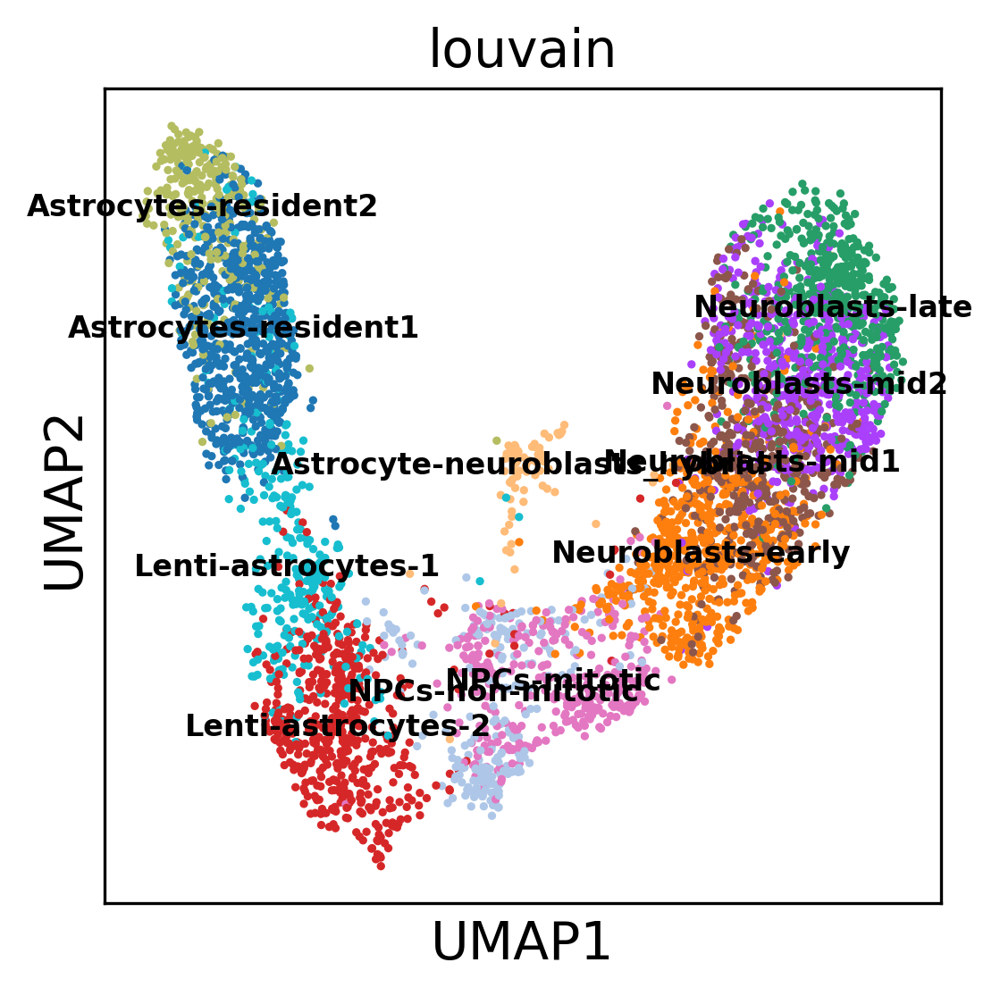

In [27]:
sc.pl.umap(adata_neural_scenic, color='louvain', legend_loc='on data', legend_fontsize=8, size=20, 
          save='_lenti-DLX2_Only_SCENIC_AUC.pdf')

##### Compare this to Figure 4A

---
## 3. Regulon specificity scores (RSS) across predicted cell types

In [29]:
from pyscenic.rss import regulon_specificity_scores
from pyscenic.plotting import plot_rss
import matplotlib.pyplot as plt
from adjustText import adjust_text
import seaborn as sns
from pyscenic.binarization import binarize

### Calculate RSS

In [30]:
rss_cellType = regulon_specificity_scores( auc_mtx, cellAnnot['Louvain_clusters_Scanpy'] )
rss_cellType

,6720489N17Rik_(+),AU041133_(+),AW146154_(+),Abl1_(+),Ar_(+),Arid3a_(+),Arnt_(+),Arnt2_(+),Arntl2_(+),Arx_(+),...,Zfp951_(+),Zfp964_(+),Zfp974_(+),Zfp976_(+),Zfx_(+),Zmiz1_(+),Zscan2_(+),Zscan20_(+),Zscan29_(+),Zxdc_(+)
Astrocytes-resident2,0.259222,0.223614,0.289513,0.213291,0.278853,0.240566,0.261249,0.318712,0.289561,0.195170,...,0.186379,0.309776,0.269036,0.319036,0.276364,0.248231,0.167445,0.281681,0.291696,0.245712
Neuroblasts-early,0.231596,0.200841,0.243622,0.211175,0.256530,0.242966,0.185345,0.240006,0.269293,0.378002,...,0.239863,0.230112,0.222601,0.205580,0.252304,0.306827,0.208265,0.225890,0.273521,0.188968
Neuroblasts-late,0.218418,0.360155,0.282863,0.258249,0.265071,0.434574,0.201146,0.243794,0.284008,0.308999,...,0.435882,0.289270,0.247436,0.224402,0.284191,0.327188,0.294078,0.244193,0.300945,0.210684
Lenti-astrocytes-1,0.226581,0.196801,0.245546,0.191269,0.270371,0.200380,0.194844,0.284692,0.223461,0.200122,...,0.176040,0.242726,0.281461,0.216266,0.230372,0.222727,0.176517,0.191749,0.238453,0.192263
Lenti-astrocytes-2,0.209462,0.189463,0.235481,0.193644,0.326274,0.193027,0.172891,0.279211,0.216969,0.224768,...,0.176794,0.211516,0.235826,0.180706,0.227191,0.237045,0.173507,0.190946,0.236465,0.172139
NPCs-non-mitotic,0.209457,0.169517,0.206666,0.181131,0.202189,0.174848,0.174466,0.204309,0.217688,0.210542,...,0.171786,0.195567,0.186369,0.172308,0.194779,0.217890,0.169571,0.174421,0.194388,0.172782
Neuroblasts-mid1,0.213328,0.241102,0.234326,0.247396,0.249766,0.270556,0.188729,0.226373,0.257934,0.329429,...,0.259838,0.247963,0.219806,0.220792,0.242122,0.299943,0.242211,0.209344,0.260959,0.197184
Neuroblasts-mid2,0.220309,0.308757,0.263204,0.291702,0.263001,0.342660,0.193807,0.239596,0.270266,0.330997,...,0.337064,0.280660,0.252959,0.232752,0.273463,0.327904,0.258734,0.225159,0.280689,0.200421
Astrocytes-resident1,0.344592,0.217988,0.398504,0.192779,0.349244,0.228522,0.258518,0.419002,0.314503,0.222844,...,0.176575,0.395835,0.304031,0.318389,0.267641,0.281163,0.169366,0.230320,0.327462,0.436832
NPCs-mitotic,0.208911,0.170140,0.201287,0.170964,0.218989,0.178151,0.171562,0.205599,0.199995,0.251014,...,0.172752,0.182008,0.175520,0.172355,0.201800,0.227226,0.167572,0.178524,0.223400,0.170465


In [31]:
rss_cellType.to_csv('RSS_table.csv')

### RSS panel plot with all cell types

In [34]:
cats = sorted(list(set(cellAnnot['Louvain_clusters_Scanpy'])))

fig = plt.figure(figsize=(15, 8))
for c,num in zip(cats, range(1,len(cats)+1)):
    x=rss_cellType.T[c]
    ax = fig.add_subplot(3,4,num)
    plot_rss(rss_cellType, c, top_n=5, max_n=None, ax=ax)
    ax.set_ylim( x.min()-(x.max()-x.min())*0.05 , x.max()+(x.max()-x.min())*0.05 )
    for t in ax.texts:
        t.set_fontsize(12)
    ax.set_ylabel('')
    ax.set_xlabel('')
    adjust_text(ax.texts, autoalign='xy', ha='right', va='bottom', arrowprops=dict(arrowstyle='-',color='lightgrey'), precision=0.001 )
 
fig.text(0.5, 0.0, 'Regulon', ha='center', va='center', size='x-large')
fig.text(0.00, 0.5, 'Regulon specificity score (RSS)', ha='center', va='center', rotation='vertical', size='x-large')
plt.tight_layout()
plt.rcParams.update({
    'figure.autolayout': True,
        'figure.titlesize': 'large' ,
        'axes.labelsize': 'medium',
        'axes.titlesize':'large',
        'xtick.labelsize':'medium',
        'ytick.labelsize':'medium'
        })
plt.savefig("pySCENIC_cellType-RSS-top5.pdf", dpi=600, bbox_inches = "tight")
plt.show()

### Select the top 10 regulons from each cell type

In [35]:
topreg = []
for i,c in enumerate(cats):
    topreg.extend(
        list(rss_cellType.T[c].sort_values(ascending=False)[:10].index )
    )
topreg = list(set(topreg))

#### Generate a Z-score for each regulon to enable comparison between regulons

In [36]:
auc_mtx_Z = pd.DataFrame( index=auc_mtx.index )
for col in list(auc_mtx.columns):
    auc_mtx_Z[ col ] = ( auc_mtx[col] - auc_mtx[col].mean()) / auc_mtx[col].std(ddof=0)
#auc_mtx_Z.sort_index(inplace=True)

#### Generate a heatmap

In [42]:
def palplot(pal, names, colors=None, size=1):
    n = len(pal)
    f, ax = plt.subplots(1, 1, figsize=(n * size * 2, size))
    ax.imshow(np.arange(n).reshape(1, n),
              cmap=mpl.colors.ListedColormap(list(pal)),
              interpolation="nearest", aspect="auto")
    ax.set_xticks(np.arange(n) - .5)
    ax.set_yticks([-.5, .5])
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    colors = n * ['k'] if colors is None else colors
    for idx, (name, color) in enumerate(zip(names, colors)):
        ax.text(0.0+idx, 0.0, name, color=color, horizontalalignment='center', verticalalignment='center')
    return f

In [38]:
cellAnnot_order = cellAnnot.sort_values(by='rank_pseudotime', axis=0)

In [39]:
index = []
for cluster in adata.obs['Louvain_clusters_Scanpy'].cat.categories: 
    index.append(np.where(adata_neural.obs['louvain'].cat.categories == cluster)[0][0])

In [40]:
colors = adata_neural.uns['louvain_colors'][index]
colorsd = dict( zip( cats, colors ))
colormap = [ colorsd[x] for x in cellAnnot_order['Louvain_clusters_Scanpy'] ]

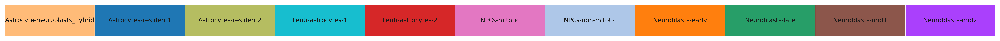

In [43]:
sns.set()
sns.set(font_scale=0.8)
fig = palplot( colors, cats, size=1.0)
plt.savefig("pySCENIC_cellType-heatmap-legend.pdf", dpi=600, bbox_inches = "tight")
plt.show()

In [44]:
row_order = adata.obs['rank_pseudotime']

In [45]:
auc_mtx_Z_order = auc_mtx_Z.reindex(row_order.sort_values().index)

In [46]:
sns.set(font_scale=1.2)
g = sns.clustermap(auc_mtx_Z_order[topreg], annot=False,  square=False,  linecolor='gray',
    yticklabels=False, xticklabels=True, vmin=-2, vmax=3, row_colors=colormap,
    cmap="YlGnBu", figsize=(21,16), 
                  row_cluster=False, 
                  rasterized=True)
g.cax.set_visible(True)
g.ax_heatmap.set_ylabel('')
g.ax_heatmap.set_xlabel('')
plt.savefig("pySCENIC_cellType-heatmap-top10.pdf", dpi=600, bbox_inches = "tight")
plt.show()

### Generate a binary regulon activity matrix:

In [47]:
binary_mtx, auc_thresholds = binarize( auc_mtx, num_workers=25 )
binary_mtx.head()

,6720489N17Rik_(+),AU041133_(+),AW146154_(+),Abl1_(+),Ar_(+),Arid3a_(+),Arnt_(+),Arnt2_(+),Arntl2_(+),Arx_(+),...,Zfp951_(+),Zfp964_(+),Zfp974_(+),Zfp976_(+),Zfx_(+),Zmiz1_(+),Zscan2_(+),Zscan20_(+),Zscan29_(+),Zxdc_(+)
AAACCCAAGAACGCGT-1,1,0,0,0,0,1,0,0,1,0,...,0,1,1,0,1,0,0,1,1,0
AAACCCACACAGGATG-1,0,0,1,0,0,0,0,0,0,1,...,0,1,0,0,0,0,0,0,0,1
AAACCCATCCCACAGG-1,0,0,0,0,0,1,0,0,0,1,...,0,0,0,0,1,0,0,0,0,0
AAACGAAGTGGAGAAA-1,1,0,0,0,0,0,0,0,1,0,...,0,1,1,0,0,0,0,0,0,0
AAACGCTCATTAGGAA-1,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0


### Show the AUC distributions for selected regulons

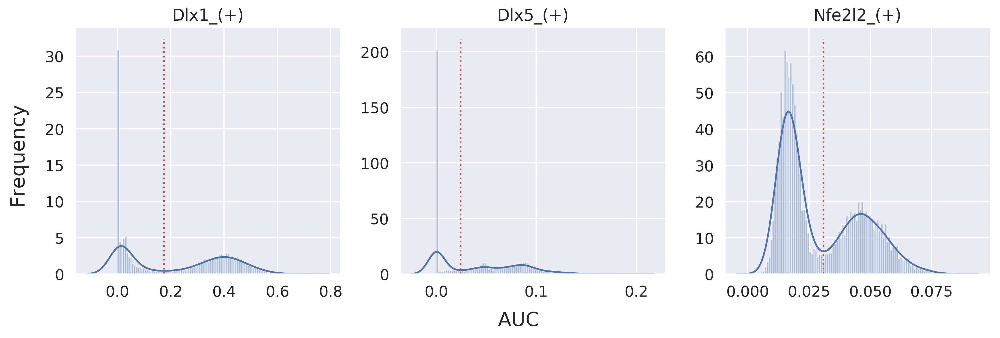

In [48]:
# select regulons:
r = [ 'Dlx1_(+)', 'Dlx5_(+)', 'Nfe2l2_(+)' ]

fig, axs = plt.subplots(1, 3, figsize=(12, 4), dpi=150, sharey=False)
for i,ax in enumerate(axs):
    sns.distplot(auc_mtx[ r[i] ], ax=ax, norm_hist=True, bins=100)
    ax.plot( [ auc_thresholds[ r[i] ] ]*2, ax.get_ylim(), 'r:')
    ax.title.set_text( r[i] )
    ax.set_xlabel('')
    
fig.text(-0.01, 0.5, 'Frequency', ha='center', va='center', rotation='vertical', size='large')
fig.text(0.5, -0.01, 'AUC', ha='center', va='center', rotation='horizontal', size='large')

fig.tight_layout()
# fig.savefig('PBMC10k_cellType-binaryPlot2.pdf', dpi=600, bbox_inches='tight')
plt.show()

---
## 4. Find positive control TFs (known regulators of neural fates)

### Validate Dlx1 regulon
Overlap with Lindtner et al., target genes of Dlx1/2

In [49]:
from scipy.stats import chi2_contingency

In [50]:
from matplotlib_venn import venn2, venn2_circles, venn2_unweighted
def intersection(lst1, lst2): 
    return list(set(lst1) & set(lst2)) 

#### Extract target genes in Dlx1 regulon

In [51]:
tf_oi = 'Dlx1'

In [52]:
tf_oi = tf_oi + '_(+)'
targets = regulons[tf_oi]

In [54]:
targets

['Dlx1',
 'Dlx2',
 'Sp9',
 'Arx',
 'Dcx',
 'Stmn2',
 'Elavl2',
 'Elavl4',
 'Dlx6os1',
 'Dlx5',
 'Tubb3',
 'Elavl3',
 'Fxyd6',
 'Islr2',
 'Rtn4',
 'Nsg2',
 'Sox4',
 'Nrxn3',
 'Bcl11b',
 'Basp1',
 'Rbfox2',
 'Tiam2',
 'Nol4',
 'Nrep']

#### DEGs from Lindtner et al.

In [55]:
Lindtner_genes = pd.read_csv('/project/GCRB/Hon_lab/s418610/Projects/03.Invivo_neuronal_reprogramming/analysis/10.Comparison_w_Lindtner2019/DE_genes/DE_genes_Lindtner2019.csv')

In [56]:
down_genes = Lindtner_genes['Gene'][(Lindtner_genes['logFC'] < 0).tolist()].tolist()

In [57]:
up_genes = Lindtner_genes['Gene'][(Lindtner_genes['logFC'] > 0).tolist()].tolist()

In [58]:
len(down_genes)

181

In [59]:
len(up_genes)

147

##### Calculate overlap between Lindtner et al. and gene universe used for GRN analysis

In [60]:
adata_scenic = sc.read(f_anndata_path)

In [61]:
adata_scenic

AnnData object with n_obs × n_vars = 4601 × 16010 
    obs: 'library_name', 'batch', 'lenti_count', 'lenti_log1p_count', 'tdT_count', 'tdT_log1p_count', 'n_counts', 'log_counts', 'n_genes', 'mt_count', 'mt_frac', 'percent_mito'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
    uns: 'library_name_colors'

In [62]:
figure, ax = plt.subplots(figsize=(10, 5))
AB = len(intersection(down_genes, adata_scenic.var.index))
overlap_down = AB

Ab = len(adata_scenic.var.index) - AB
aB = len(down_genes) - AB

venn2(subsets = (Ab, aB, AB), 
              set_labels = ('All input genes for SCENIC', 
                        'Lindtner et al. down genes'))

In [63]:
figure, ax = plt.subplots(figsize=(10, 5))
AB = len(intersection(up_genes, adata_scenic.var.index))
overlap_up = AB

Ab = len(adata_scenic.var.index) - AB
aB = len(up_genes) - AB

venn2(subsets = (Ab, aB, AB), 
              set_labels = ('All input genes for SCENIC', 
                        'Lindtner et al. up genes'))

##### Calculate overlap and p values

Regulon is significantly enriched of down genes
p value is 4.0117117906122395e-40


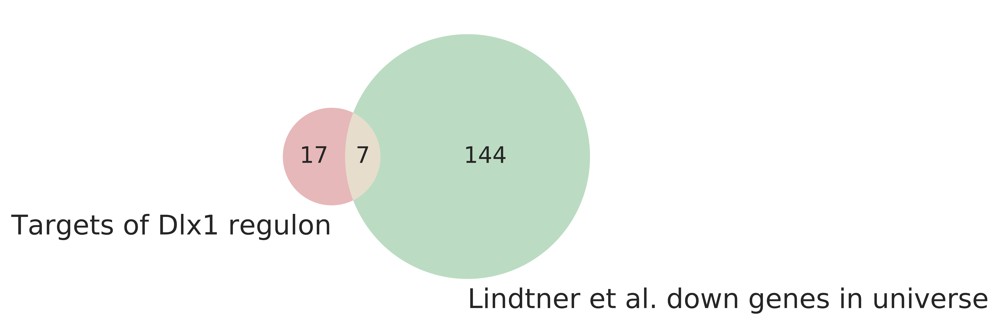

In [65]:
AB = len(intersection(down_genes, targets))

Ab = len(targets) - AB
aB = overlap_down - AB

venn2(subsets = (Ab, aB, AB), 
              set_labels = ('Targets of Dlx1 regulon', 
                        'Lindtner et al. down genes in universe'))

obs = np.array([[AB, aB], [Ab, adata_scenic.X.shape[1] - AB - aB - Ab]])

_, p_val, _, _ = chi2_contingency(obs)

direction_test = AB/Ab > aB/(adata_scenic.X.shape[1] - AB - aB - Ab)

if p_val < 0.05:
#    if p_val < 0.05:
    if direction_test:
        print('Regulon is significantly enriched of down genes')
    else: 
        print('Regulon is significantly depleted of down genes')
    print('p value is {}'.format(p_val))
#        print('P value is {}'.format(p_val))
else:
    print('Regulon is neither enriched or depleted of down genes')
    
# plt.savefig('/project/GCRB/Hon_lab/s418610/Projects/03.Invivo_neuronal_reprogramming/99.Manuscript/Figures_v2/Venn_Dlx1_regulon_Lindtner_down.pdf', 
#            dpi=600)

Regulon is neither enriched or depleted of up genes


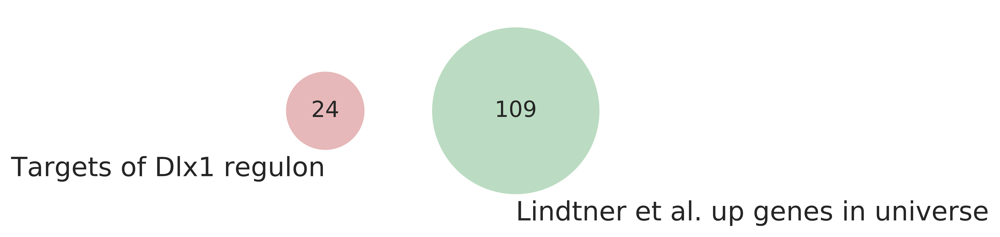

In [66]:
AB = len(intersection(up_genes, targets))

Ab = len(targets) - AB
aB = overlap_up - AB

venn2(subsets = (Ab, aB, AB), 
              set_labels = ('Targets of Dlx1 regulon', 
                        'Lindtner et al. up genes in universe'))

obs = np.array([[AB, aB], [Ab, adata_scenic.X.shape[1] - AB - aB - Ab]])

_, p_val, _, _ = chi2_contingency(obs)

direction_test = AB/Ab > aB/(adata_scenic.X.shape[1] - AB - aB - Ab)

if p_val < 0.05:
#    if p_val < 0.05:
    if direction_test:
        print('Regulon is significantly enriched of up genes')
    else: 
        print('Regulon is significantly depleted of up genes')
    print('p value is {}'.format(p_val))
#        print('P value is {}'.format(p_val))
else:
    print('Regulon is neither enriched or depleted of up genes')

#### aREs and rREs from Lindtner et al.

In [67]:
Lindtner_peaks = pd.read_csv('/project/GCRB/Hon_lab/s418610/Projects/03.Invivo_neuronal_reprogramming/analysis/10.Comparison_w_Lindtner2019/REs/Dlx_ChIP-seq_peaks.csv')

/home2/s418610/.conda/envs/py37_res_GRN/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3058: DtypeWarning: Columns (18,20,121,123,124,125,126,128) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [68]:
aRE_regions = Lindtner_peaks[Lindtner_peaks['a.RE.bdg'] == 1]

aRE_genes = aRE_regions['Gene']

aRE_genes = aRE_genes.unique().tolist()

rRE_regions = Lindtner_peaks[Lindtner_peaks['r.RE.bdg'] == 1]

rRE_genes = rRE_regions['Gene']

rRE_genes = rRE_genes.unique().tolist()

In [69]:
len(aRE_genes)

447

In [70]:
len(rRE_genes)

418

##### Calculate overlap between Lindtner et al. and gene universe used for GRN analysis

In [71]:
adata_scenic = sc.read(f_anndata_path)

In [72]:
adata_scenic

AnnData object with n_obs × n_vars = 4601 × 16010 
    obs: 'library_name', 'batch', 'lenti_count', 'lenti_log1p_count', 'tdT_count', 'tdT_log1p_count', 'n_counts', 'log_counts', 'n_genes', 'mt_count', 'mt_frac', 'percent_mito'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
    uns: 'library_name_colors'

In [73]:
figure, ax = plt.subplots(figsize=(10, 5))
AB = len(intersection(aRE_genes, adata_scenic.var.index))
overlap_aRE = AB

Ab = len(adata_scenic.var.index) - AB
aB = len(aRE_genes) - AB

venn2(subsets = (Ab, aB, AB), 
              set_labels = ('All input genes for SCENIC', 
                        'Lindtner et al. aRE genes'))

In [74]:
figure, ax = plt.subplots(figsize=(10, 5))
AB = len(intersection(rRE_genes, adata_scenic.var.index))
overlap_rRE = AB

Ab = len(adata_scenic.var.index) - AB
aB = len(rRE_genes) - AB

venn2(subsets = (Ab, aB, AB), 
              set_labels = ('All input genes for SCENIC', 
                        'Lindtner et al. rRE genes'))

##### Calculate overlap and p values

Regulon is significantly enriched of aRE genes
p value is 4.2247205925429776e-27


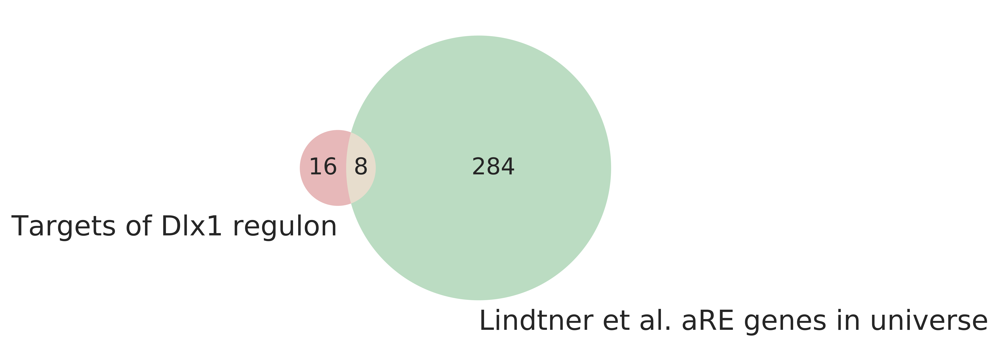

In [75]:
AB = len(intersection(aRE_genes, targets))

Ab = len(targets) - AB
aB = overlap_aRE - AB

venn2(subsets = (Ab, aB, AB), 
              set_labels = ('Targets of Dlx1 regulon', 
                        'Lindtner et al. aRE genes in universe'))

obs = np.array([[AB, aB], [Ab, adata_scenic.X.shape[1] - AB - aB - Ab]])

_, p_val, _, _ = chi2_contingency(obs)

direction_test = AB/Ab > aB/(adata_scenic.X.shape[1] - AB - aB - Ab)

if p_val < 0.05:
#    if p_val < 0.05:
    if direction_test:
        print('Regulon is significantly enriched of aRE genes')
    else: 
        print('Regulon is significantly depleted of aRE genes')
    print('p value is {}'.format(p_val))
#        print('P value is {}'.format(p_val))
else:
    print('Regulon is neither enriched or depleted of aRE genes')
    
# plt.savefig('/project/GCRB/Hon_lab/s418610/Projects/03.Invivo_neuronal_reprogramming/99.Manuscript/Figures_v2/Venn_Dlx1_regulon_Lindtner_aRE_genes.pdf', 
#            dpi=600)

Regulon is significantly enriched of rRE genes
p value is 2.5398567622673203e-09


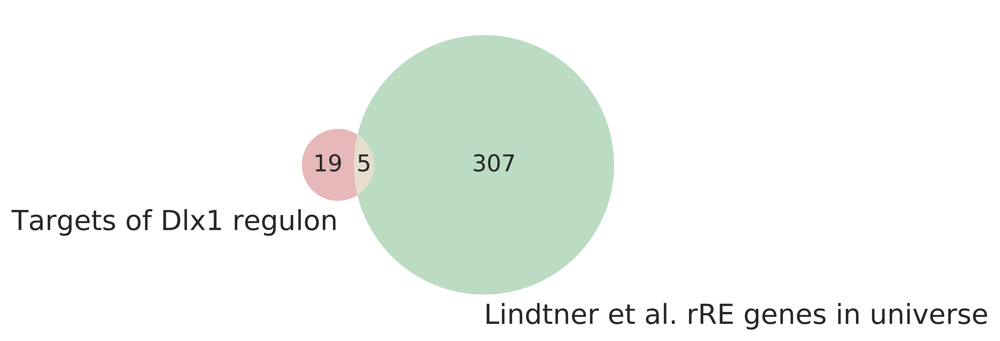

In [76]:
AB = len(intersection(rRE_genes, targets))

Ab = len(targets) - AB
aB = overlap_rRE - AB

venn2(subsets = (Ab, aB, AB), 
              set_labels = ('Targets of Dlx1 regulon', 
                        'Lindtner et al. rRE genes in universe'))

obs = np.array([[AB, aB], [Ab, adata_scenic.X.shape[1] - AB - aB - Ab]])

_, p_val, _, _ = chi2_contingency(obs)

direction_test = AB/Ab > aB/(adata_scenic.X.shape[1] - AB - aB - Ab)

if p_val < 0.05:
#    if p_val < 0.05:
    if direction_test:
        print('Regulon is significantly enriched of rRE genes')
    else: 
        print('Regulon is significantly depleted of rRE genes')
    print('p value is {}'.format(p_val))
#        print('P value is {}'.format(p_val))
else:
    print('Regulon is neither enriched or depleted of rRE genes')